In [1]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers, utils
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import array_to_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [2]:
from IPython.display import display

## Download data

In [3]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

In [4]:
data_dir

'/Users/raunavghosh/.keras/datasets/BSR'

## Create training and validation sets

In [5]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Metal device set to: Apple M2

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB

Found 500 files belonging to 1 classes.
Using 100 files for validation.


## Rescalling images

In [6]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

2023-05-24 12:43:04.830940: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


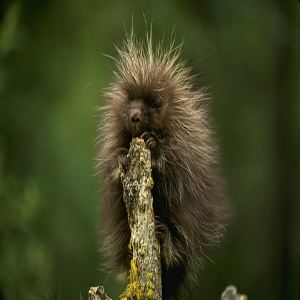

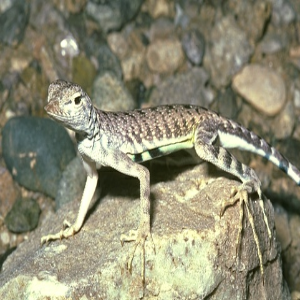

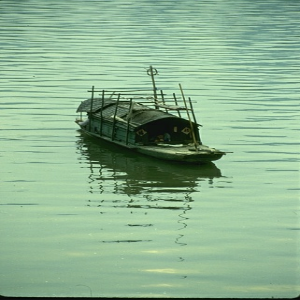

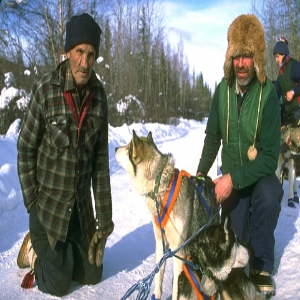

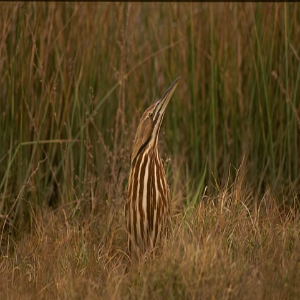

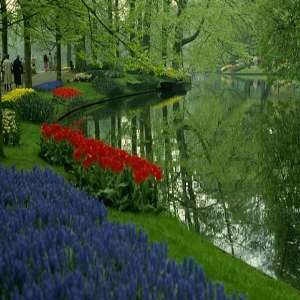

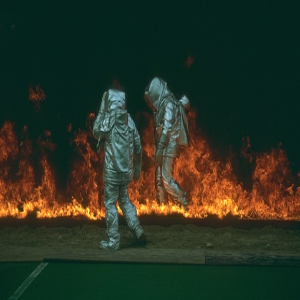

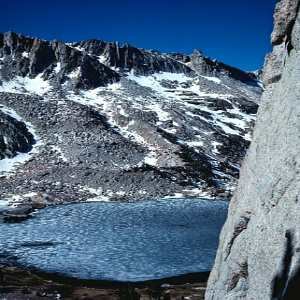

In [7]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

In [8]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

## Crop and resize images

In [9]:
# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

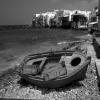

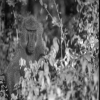

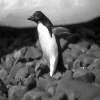

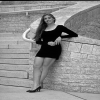

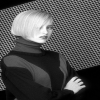

...

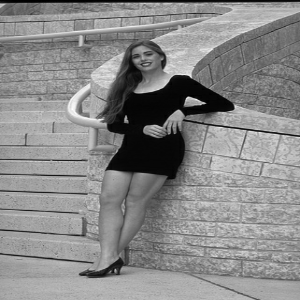

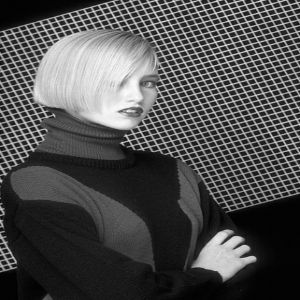

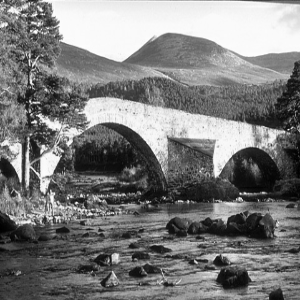

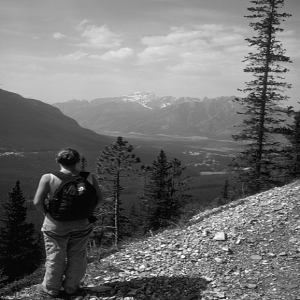

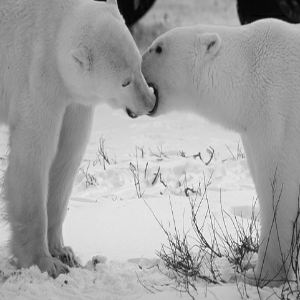

In [10]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

## Model

In [11]:
def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)

## Utility functions

In [12]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

## Callback

In [13]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [14]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d (Conv2D)             (None, None, None, 64)    1664      
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 conv2d_3 (Conv2D)           (None, None, None, 9)     2601      
                                                                 
 tf.nn.depth_to_space (TFOpL  (None, None, None, 1)    0         
 ambda)                                                          
                                                             

In [15]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

# model.fit(
#     train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
# )

# The model weights (that are considered the best) are loaded into the model.
# model.load_weights(checkpoint_filepath)

In [16]:
# model.save("./espcn_trained.h5")
model = tf.keras.models.load_model("./espcn_trained.h5")

1/1 [==============================] - 0s 100ms/step
255.0 6.0
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.6142


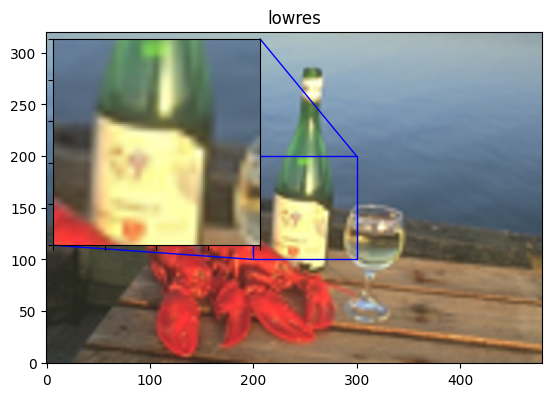

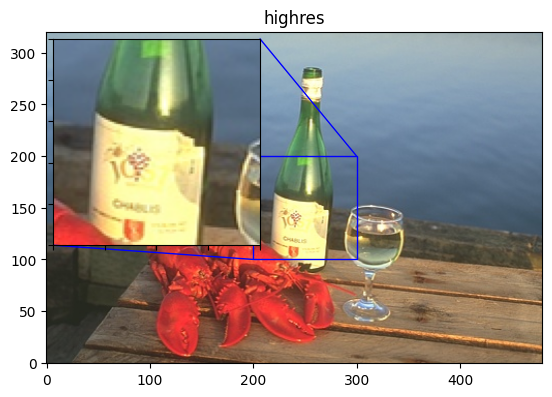

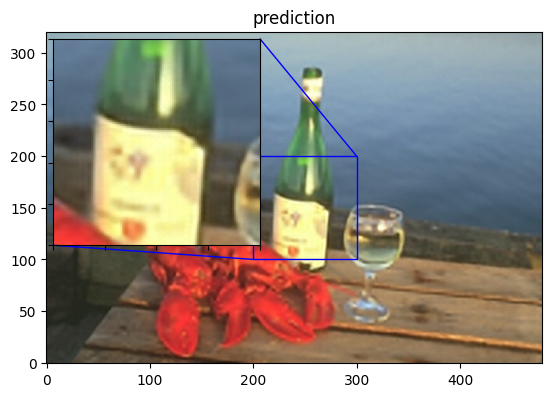

1/1 [==============================] - 0s 13ms/step
255.0 21.0
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 26.1737


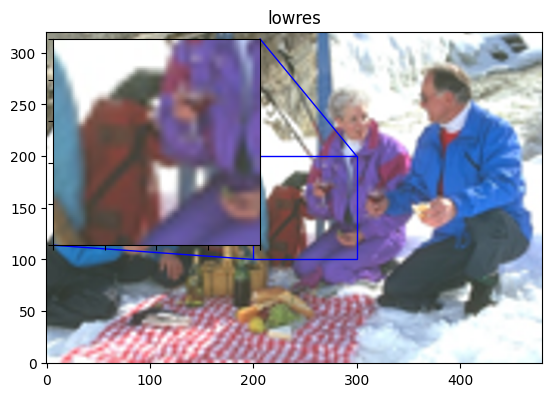

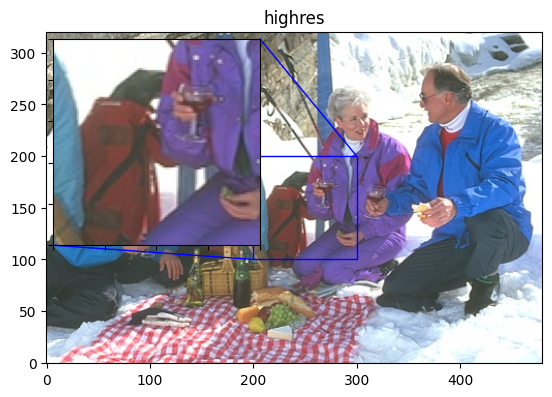

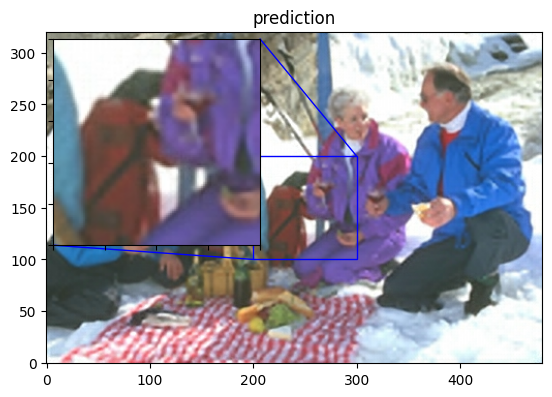

1/1 [==============================] - 0s 52ms/step
255.0 0.0
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.4323


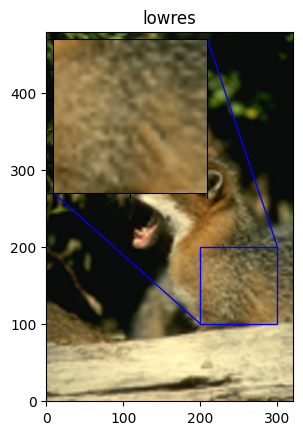

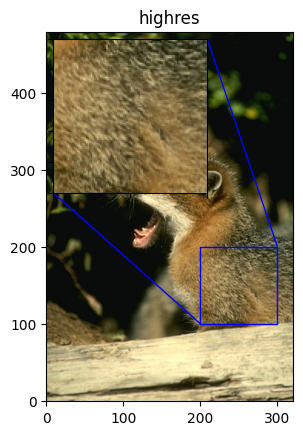

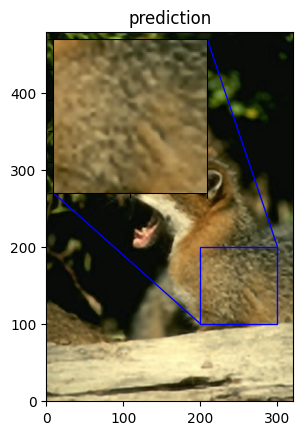

1/1 [==============================] - 0s 13ms/step
251.0 0.0
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2928


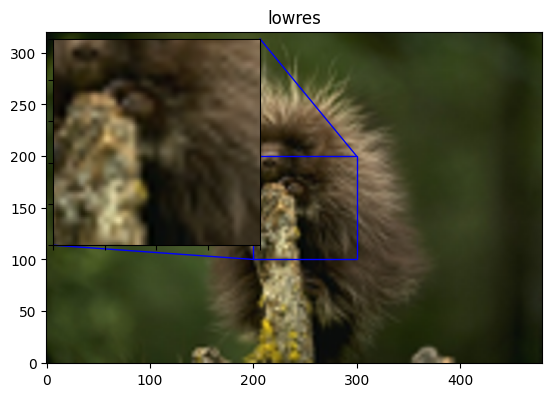

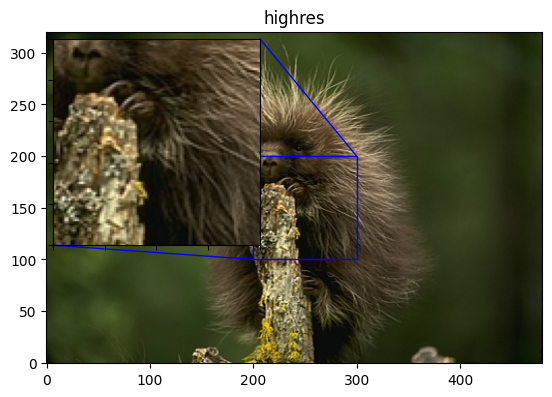

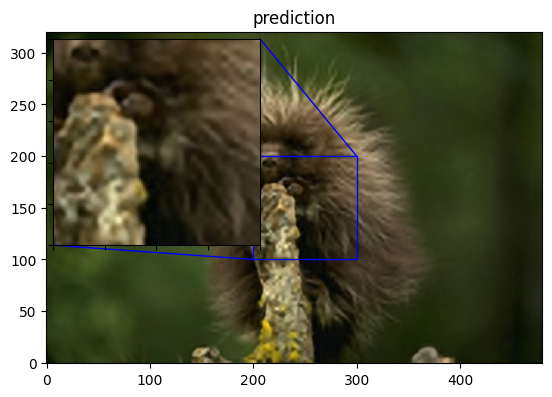

1/1 [==============================] - 0s 12ms/step
255.0 0.0
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.4133


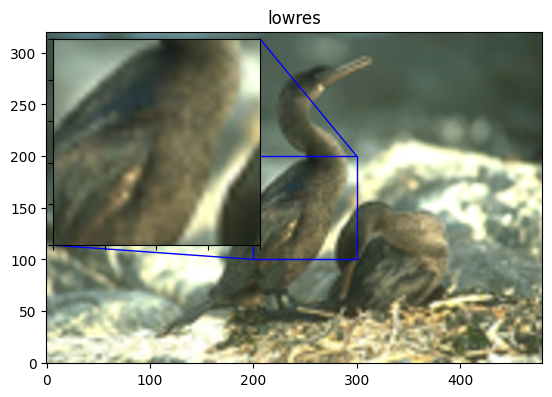

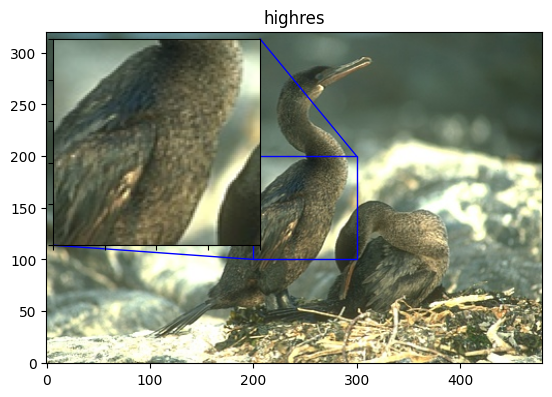

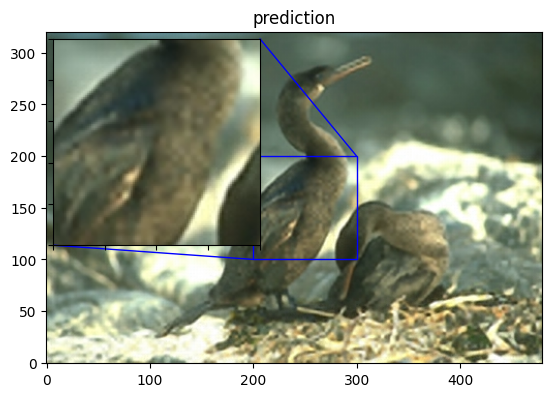

1/1 [==============================] - 0s 11ms/step
255.0 0.0
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.7590


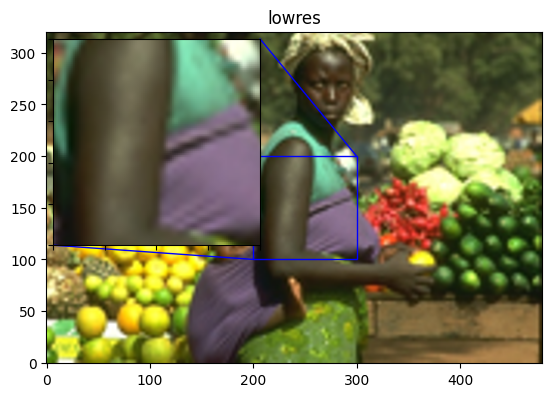

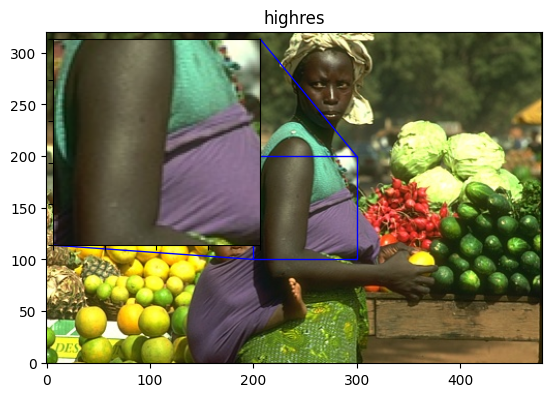

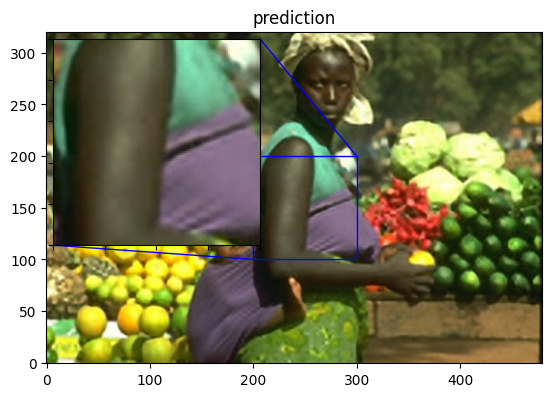

1/1 [==============================] - 0s 15ms/step
255.0 0.0
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 27.1690


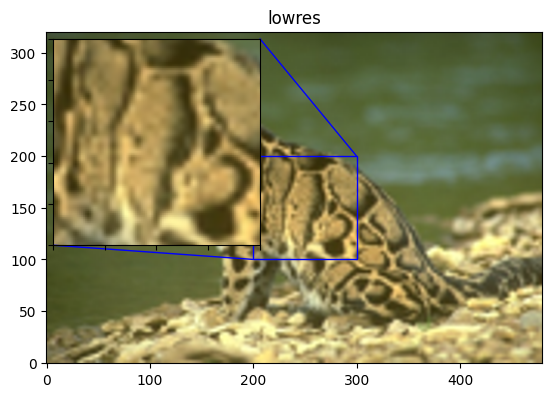

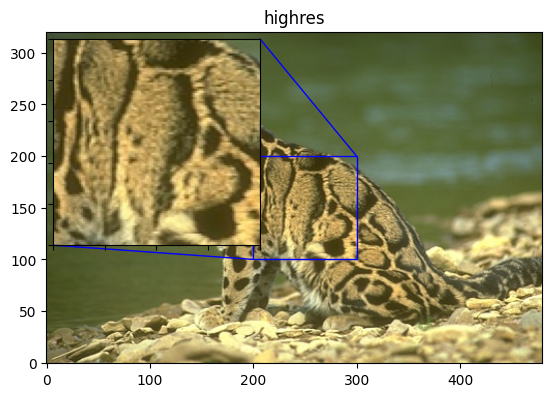

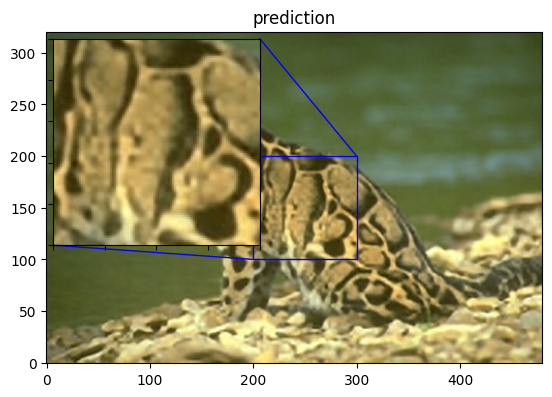

1/1 [==============================] - 0s 28ms/step
255.0 0.0
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.6987


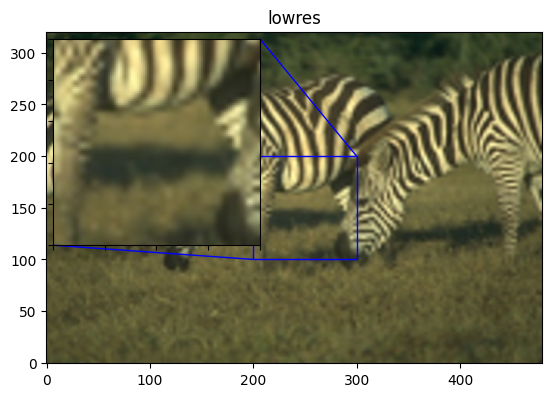

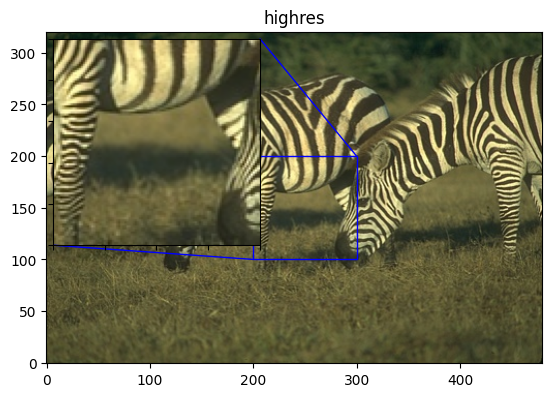

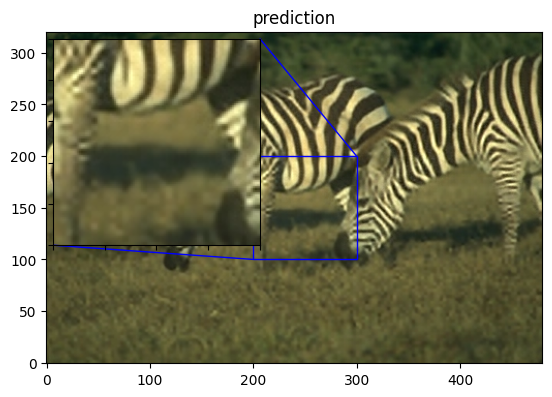

1/1 [==============================] - 0s 19ms/step
189.0 0.0
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.0877


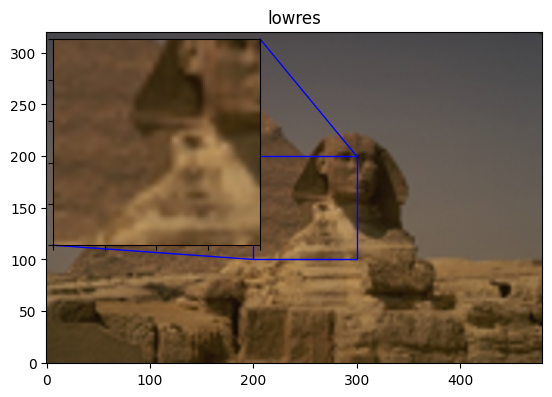

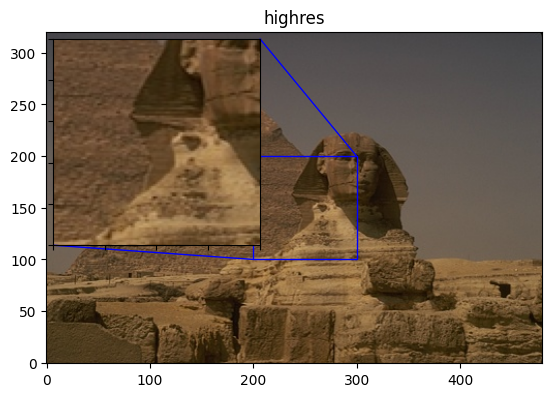

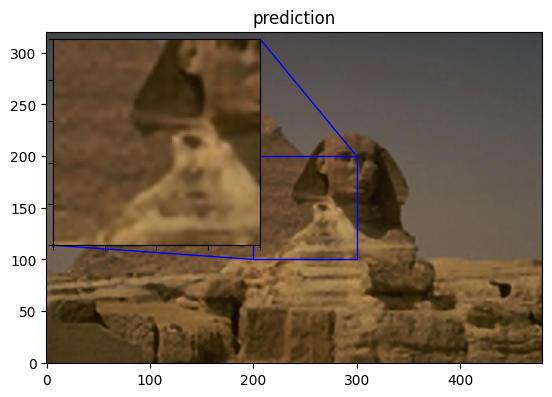

1/1 [==============================] - 0s 21ms/step
255.0 0.0
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.7977


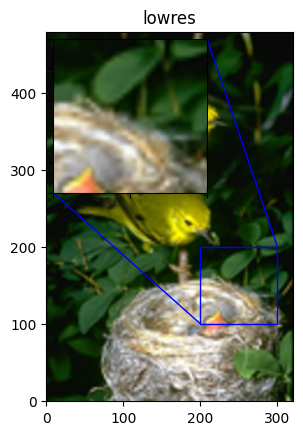

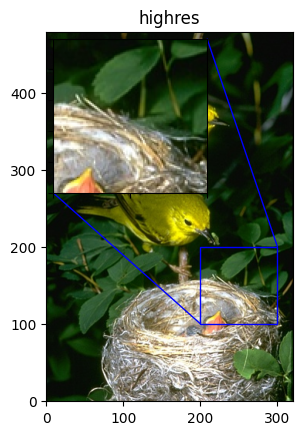

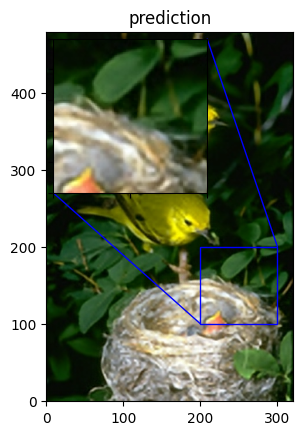

Avg. PSNR of lowres images is 26.7357
Avg. SSIM of lowres images is 0.8208
Avg. PSNR of reconstructions is 27.4438
Avg. SSIM of reconstructions is 0.8412


In [18]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0
total_bicubic_ssim = 0
total_test_ssim = 0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = utils.load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    lowres_img = lowres_input.resize((w, h))
    lowres_input_arr = utils.img_to_array(lowres_input)
    prediction = upscale_image(model, lowres_input)
    lowres_img_arr = utils.img_to_array(lowres_img)
    highres_img_arr = utils.img_to_array(highres_img)
    predict_img_arr = utils.img_to_array(prediction)
    print(np.max(predict_img_arr), np.min(predict_img_arr))
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    bicubic_ssim = tf.image.ssim(lowres_img_arr, highres_img_arr, max_val=255)
    # print(lowres_img_arr.shape, highres_img_arr.shape)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)
    test_ssim = tf.image.ssim(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    total_bicubic_ssim += bicubic_ssim
    total_test_ssim += test_ssim


    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. SSIM of lowres images is %.4f" % (total_bicubic_ssim / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))
print("Avg. SSIM of reconstructions is %.4f" % (total_test_ssim / 10))